In [ ]:
!pip install scanpy fastglmpca

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

sns.set_style("ticks")
sc.settings.verbosity = 3

In [4]:
!wget -O t_cell_leukemia.h5ad https://datasets.cellxgene.cziscience.com/a89138d7-7812-41bf-8242-880ff19cbf20.h5ad

--2026-01-30 08:27:55--  https://datasets.cellxgene.cziscience.com/a89138d7-7812-41bf-8242-880ff19cbf20.h5ad
Resolving datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)... 54.192.100.121, 54.192.100.87, 54.192.100.53, ...
Connecting to datasets.cellxgene.cziscience.com (datasets.cellxgene.cziscience.com)|54.192.100.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3831893687 (3.6G) [binary/octet-stream]
Saving to: ‘t_cell_leukemia.h5ad’

t_cell_leukemia.h5a 100%[===================>]   3.57G  79.1MB/s    in 46s     

2026-01-30 08:28:41 (80.0 MB/s) - ‘t_cell_leukemia.h5ad’ saved [3831893687/3831893687]



In [5]:
adata = sc.read_h5ad("t_cell_leukemia.h5ad", backed="r")
print(adata)
print("\nTop sample_ID:")
print(adata.obs["sample_ID"].value_counts().head(10))

AnnData object with n_obs × n_vars = 216507 × 35459 backed at 't_cell_leukemia.h5ad'
    obs: 'sample_ID', 'cell_cycle_phase', 'broad_anno', 'fine_anno', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'suspension_type', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'cell_type_ontology_term_id', 'leiden', 'Fig1_perPatient_clust', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'batch_condition', 'citation', 'default_embedding', 'hvg', 'leiden', 'neighbors', 'organism', 'organism_ontology_term_id', 'pca', 'schema_reference', 'schema_version', 'study_pi', 'title', 'umap'
    obsm: 'X_pca', 'X

In [6]:
sample = "P021_D0"
mask = (adata.obs["sample_ID"] == sample).values
print("Cells in", sample, ":", mask.sum())

adata_s = adata[mask].to_memory()
adata_s.write_h5ad(f"{sample}.h5ad")
print(adata_s)

Cells in P021_D0 : 16753
AnnData object with n_obs × n_vars = 16753 × 35459
    obs: 'sample_ID', 'cell_cycle_phase', 'broad_anno', 'fine_anno', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'suspension_type', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'cell_type_ontology_term_id', 'leiden', 'Fig1_perPatient_clust', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'batch_condition', 'citation', 'default_embedding', 'hvg', 'leiden', 'neighbors', 'organism', 'organism_ontology_term_id', 'pca', 'schema_reference', 'schema_version', 'study_pi', 'title', 'umap'
    obsm: 'X_pca', 'X_umap'
  

MT genes detected: 13 out of 35459
       total_counts  n_genes_by_counts  pct_counts_mt
count  16753.000000       16753.000000   16753.000000
mean    2745.038330        1951.875783       0.818550
std      475.065338         776.949567       0.464268
min      593.437195         331.000000       0.000000
25%     2420.621582        1283.000000       0.497686
50%     2777.087158        1880.000000       0.728268
75%     3092.339844        2481.000000       1.069454
max     4009.839600        4700.000000       4.779367


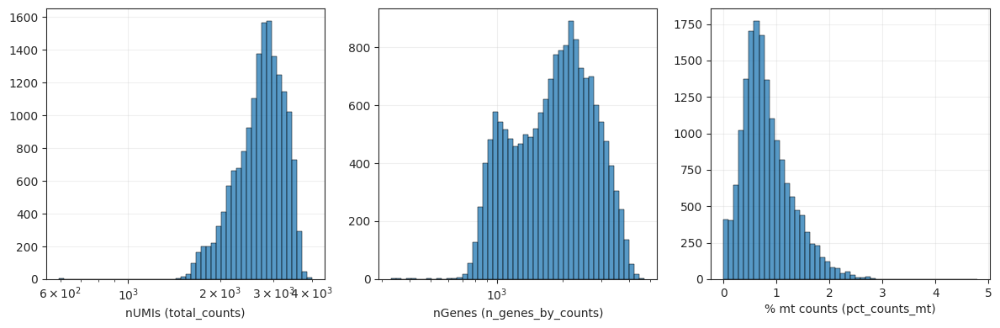

In [7]:
gene_names = (
    adata_s.var["feature_name"].astype(str)
    if "feature_name" in adata_s.var.columns
    else adata_s.var_names.astype(str)
)

adata_s.var["mt"] = gene_names.str.upper().str.startswith("MT-")

print("MT genes detected:", int(adata_s.var["mt"].sum()), "out of", adata_s.n_vars)

sc.pp.calculate_qc_metrics(
    adata_s,
    qc_vars=["mt"],
    percent_top=None,
    inplace=True,
    log1p=False,
)

print(adata_s.obs[["total_counts", "n_genes_by_counts", "pct_counts_mt"]].describe())

fig, axes = plt.subplots(ncols=3, figsize=(12, 4))

sns.histplot(adata_s.obs["total_counts"], log_scale=True, bins=50, edgecolor="black", ax=axes[0])
axes[0].set_xlabel("nUMIs (total_counts)")
axes[0].set_ylabel("")
axes[0].grid(alpha=0.3)

sns.histplot(adata_s.obs["n_genes_by_counts"], log_scale=True, bins=50, edgecolor="black", ax=axes[1])
axes[1].set_xlabel("nGenes (n_genes_by_counts)")
axes[1].set_ylabel("")
axes[1].grid(alpha=0.3)

sns.histplot(adata_s.obs["pct_counts_mt"], bins=50, edgecolor="black", ax=axes[2])
axes[2].set_xlabel("% mt counts (pct_counts_mt)")
axes[2].set_ylabel("")
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [8]:
n0 = adata_s.n_obs

mask_genes = adata_s.obs["n_genes_by_counts"] >= 500
mask_mt    = adata_s.obs["pct_counts_mt"] <= 3

print("Before QC:", n0)
print("Pass n_genes>=500:", mask_genes.sum())
print("Pass pct_mt<=3:", mask_mt.sum())
print("Pass BOTH:", (mask_genes & mask_mt).sum())

adata_s = adata_s[mask_genes & mask_mt].copy()
print("After QC:", adata_s.n_obs)

Before QC: 16753
Pass n_genes>=500: 16743
Pass pct_mt<=3: 16750
Pass BOTH: 16742
After QC: 16742


In [9]:
print("X type:", type(adata_s.X))
print("X max:", adata_s.X.max())

sc.pp.scrublet(adata_s)

print(adata_s.obs[["doublet_score", "predicted_doublet"]].head())
print("\nDoublets predicted:", adata_s.obs["predicted_doublet"].sum(), "/", adata_s.n_obs)
print("Doublet rate:", adata_s.obs["predicted_doublet"].mean())

X type: <class 'scipy.sparse._csr.csr_matrix'>
X max: 8.990784
Running Scrublet
filtered out 13659 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:07)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.18
Detected doublet rate = 7.3%
Estimated detectable doublet fraction = 72.5%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 10.0%
    Scrublet finished (0:04:14)
                             doublet_score  predicted_doublet
P021_D0::AAACCTGAGAGACTTA-1       0.075520              False
P021_D0::AAACCTGAGCGATATA-1       0.02440

predicted_doublet
False    15527
True      1215
Name: count, dtype: int64


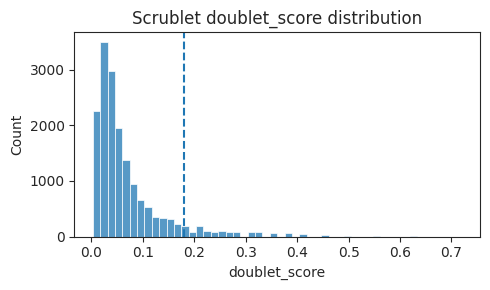

In [15]:
print(adata_s.obs["predicted_doublet"].value_counts())

thr = 0.18
plt.figure(figsize=(5,3))
sns.histplot(adata_s.obs["doublet_score"], bins=50)
plt.axvline(thr, linestyle="--")
plt.title("Scrublet doublet_score distribution")
plt.tight_layout()
plt.show()


In [16]:
print("Before:", adata_s.n_obs)

adata_s = adata_s[~adata_s.obs["predicted_doublet"]].copy()

print("After :", adata_s.n_obs)
print("Removed:", 16742 - adata_s.n_obs)

Before: 16742
After : 15527
Removed: 1215


In [18]:
X = adata_s.X

if hasattr(X, "data"):
    frac_nonint = np.mean(np.abs(X.data - np.round(X.data)) > 1e-6)
    xmax = X.data.max() if X.data.size else 0
else:
    frac_nonint = np.mean(np.abs(X - np.round(X)) > 1e-6)
    xmax = X.max()

print("max(X):", float(xmax))
print("fraction of non-integers:", float(frac_nonint))
print("has adata_s.uns['log1p'] ?", "log1p" in adata_s.uns)

max(X): 8.99078369140625
fraction of non-integers: 0.9999975796704519
has adata_s.uns['log1p'] ? False


In [23]:
adata = adata_s

adata.var_names = adata.var["feature_name"].astype(str)
adata.var_names_make_unique()

<Axes: ylabel='Count'>

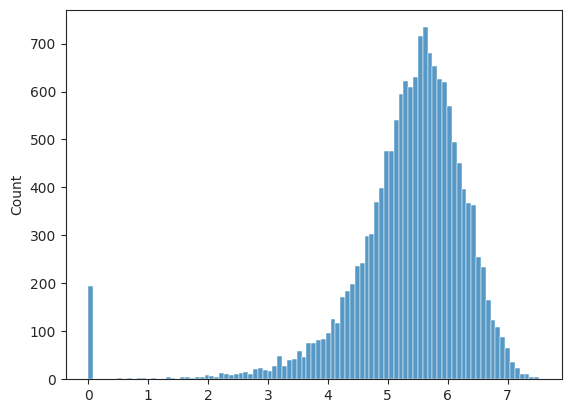

In [25]:
adata[:, "MALAT1"].X.toarray().T[0]

MALAT1_expr = adata[:, "MALAT1"].X.toarray().T[0]
sns.histplot(MALAT1_expr)

In [26]:
mean = adata.X.mean(axis=0).A[0]
variance = np.var(adata.X.toarray(), axis=0)

/tmp/ipython-input-3942631302.py:2: RuntimeWarning: divide by zero encountered in log10
  x=np.log10(mean),
/tmp/ipython-input-3942631302.py:3: RuntimeWarning: divide by zero encountered in log10
  y=np.log10(variance),


Text(0, 0.5, 'log10(Variance)')

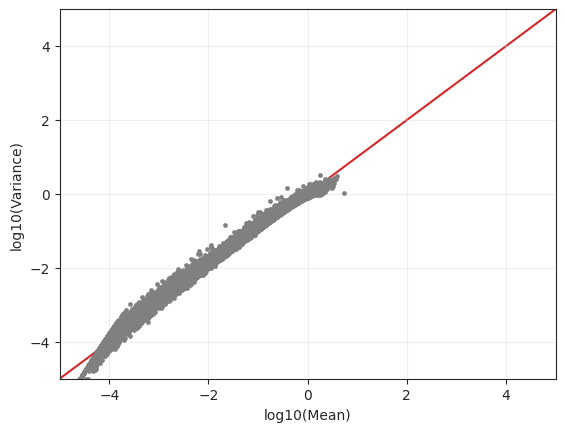

In [27]:
ax = sns.scatterplot(
    x=np.log10(mean),
    y=np.log10(variance),
    edgecolor=None,
    color="grey",
    s=10,
)
ax.plot([-10, 20], [-10, 20], zorder=-2, color=sns.color_palette()[3])

ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
ax.grid(alpha=0.3)

ax.set_xlabel("log10(Mean)")
ax.set_ylabel("log10(Variance)")

In [28]:
adata = adata_s

adata.var_names = adata.var["feature_name"].astype(str)
adata.var_names_make_unique()

print("donor_id unique:", adata.obs["donor_id"].nunique())
print(adata.obs["donor_id"].value_counts().head())

donor_id unique: 1
donor_id
P021    15527
Name: count, dtype: int64


In [32]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=3000
)

print("HVG count:", int(adata.var["highly_variable"].sum()))
print("First 20 HVG:", adata.var_names[adata.var["highly_variable"]][:20].tolist())

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
HVG count: 3000
First 20 HVG: ['FAM87B', 'HES4', 'RNF223', 'ENSG00000272141', 'TTLL10-AS1', 'TNFRSF18', 'TNFRSF4', 'CFAP74', 'SKI', 'PLCH2', 'ENSG00000272088', 'DFFB', 'AJAP1', 'UTS2', 'TNFRSF9', 'ENSG00000284747', 'ERRFI1-DT', 'RERE', 'SLC2A5', 'PIK3CD']


/usr/lib/python3.12/functools.py:912: UserWarning: Received a view of an AnnData. Making a copy.
  return dispatch(args[0].__class__)(*args, **kw)
/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=30
    finished (0:00:12)


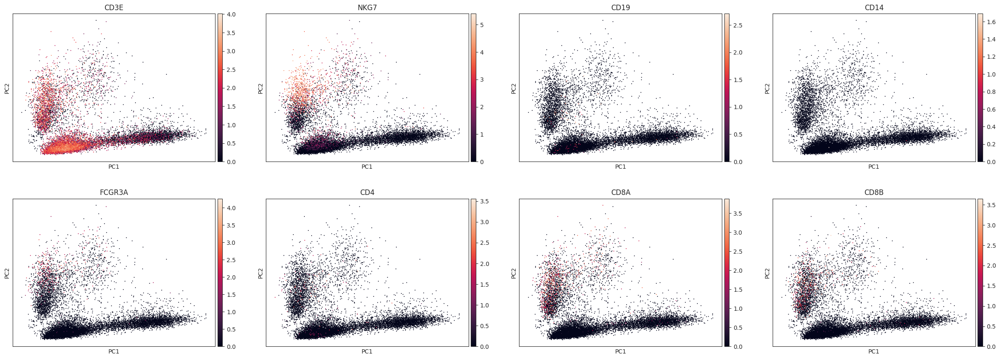

In [34]:
adata = adata_s

adata.var_names = adata.var["feature_name"].astype(str)
adata.var_names_make_unique()

adata.raw = adata

adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=30)

sc.pl.pca(
    adata,
    color=["CD3E", "NKG7", "CD19", "CD14", "FCGR3A", "CD4", "CD8A", "CD8B"]
)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:49)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:17)


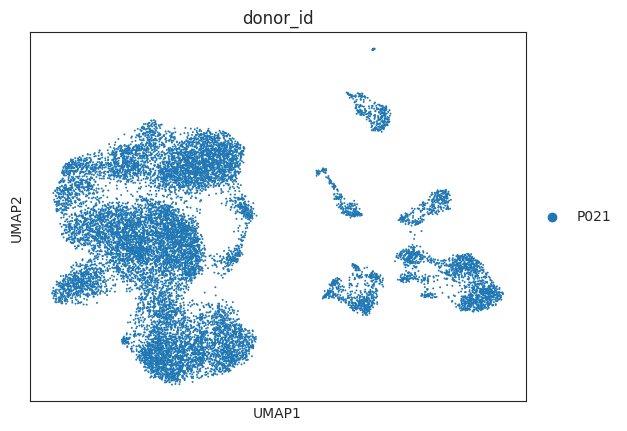

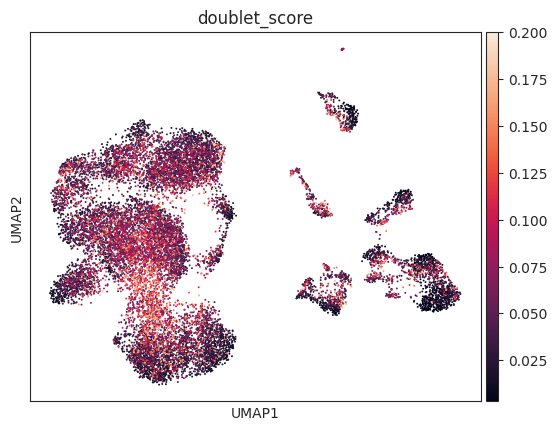

In [35]:
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata)

sc.pl.umap(adata, color="donor_id")

if "doublet_score" in adata.obs.columns:
    sc.pl.umap(adata, color=["doublet_score"], vmax=0.2)
else:
    print("doublet_score not found in this `adata`. Проверь, что ты делал scrublet ДО сабсета/HVG.")

In [39]:
print(adata)
print("Has UMAP:", "X_umap" in adata.obsm)
print("Has leiden:", "leiden" in adata.obs)

AnnData object with n_obs × n_vars = 15527 × 3000
    obs: 'sample_ID', 'cell_cycle_phase', 'broad_anno', 'fine_anno', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'suspension_type', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'cell_type_ontology_term_id', 'leiden', 'Fig1_perPatient_clust', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'batch_condition', 'citation', 'default_emb

In [40]:
adata.obs["leiden"].value_counts().sort_index()

,count
leiden,
4,98
6,7
7,4329
10,582
15,297
16,893
18,3395
22,3362
27,1


In [41]:
adata.obs["leiden_old"] = adata.obs["leiden"].astype(str)

sc.tl.leiden(adata, resolution=0.5, key_added="leiden_new")

/tmp/ipython-input-2225375222.py:3: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata, resolution=0.5, key_added="leiden_new")


running Leiden clustering
    finished: found 15 clusters and added
    'leiden_new', the cluster labels (adata.obs, categorical) (0:00:24)


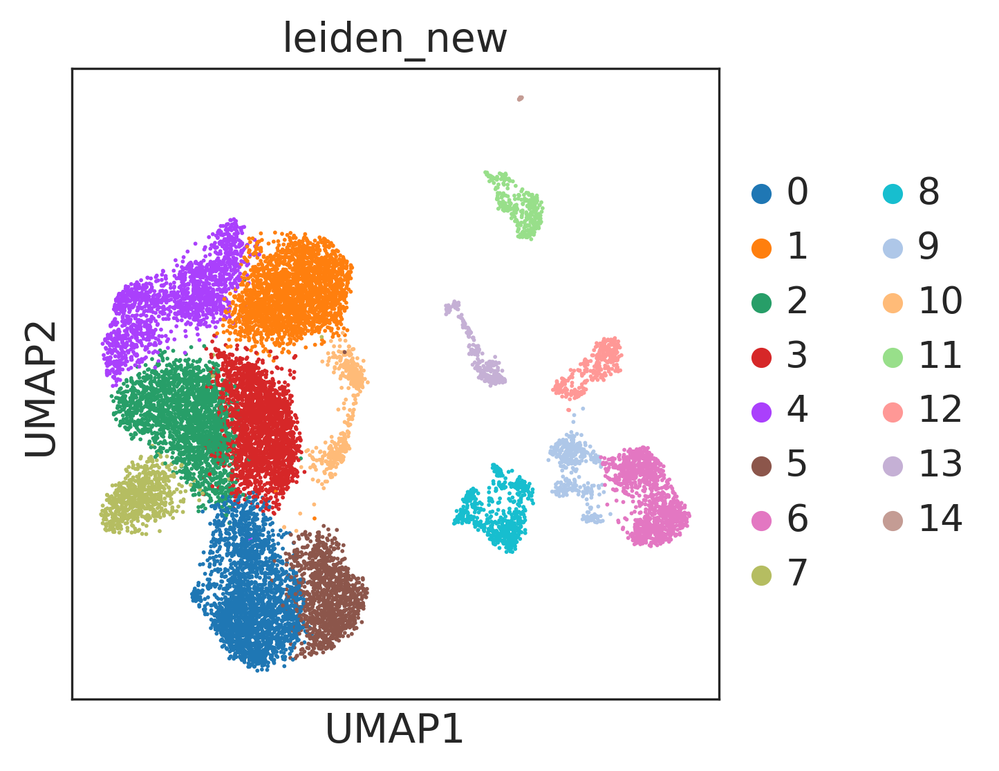

In [45]:
sns.set_style("ticks")
sc.settings.verbosity = 3

sc.pl.umap(adata, color=["leiden_new"])

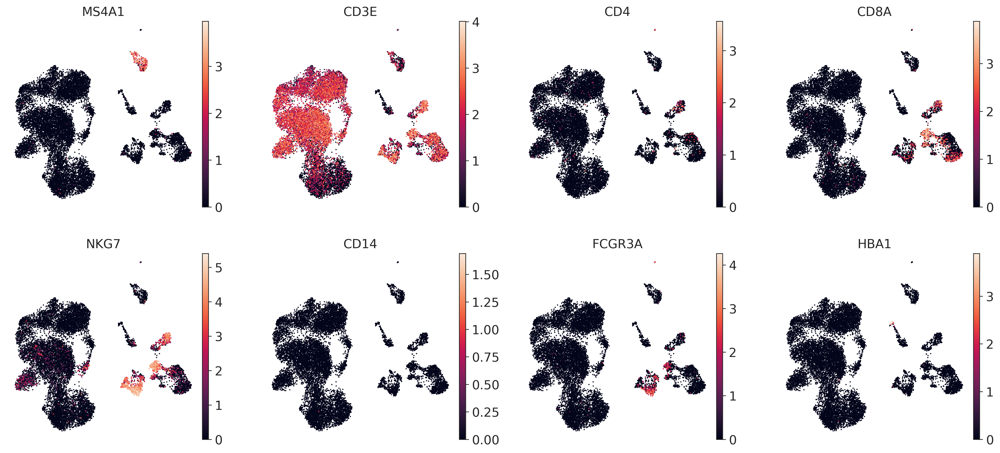

In [46]:
sc.pl.umap(
    adata,
    color=["MS4A1", "CD3E", "CD4", "CD8A", "NKG7", "CD14", "FCGR3A", "HBA1"],
    frameon=False
)

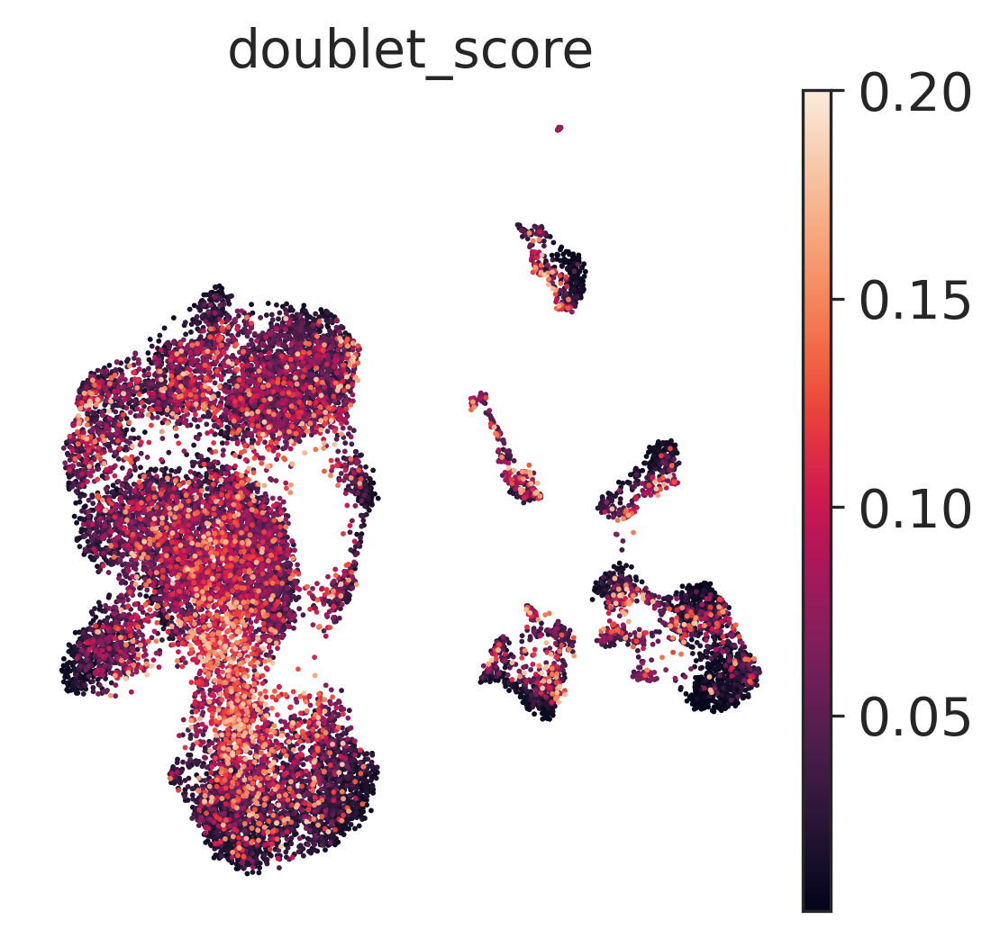

In [47]:
sc.pl.umap(adata, color=["doublet_score"], frameon=False, vmax=0.2)

In [48]:
sc.tl.rank_genes_groups(adata, groupby="leiden_new", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:13)


In [51]:
for g in adata.obs["leiden_new"].cat.categories:
    df = sc.get.rank_genes_groups_df(adata, group=g, log2fc_min=2)
    print("\nCLUSTER", g, "top markers:")
    display(df.head(10))


CLUSTER 0 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,MYO18B,65.970810,3.959293,0.0,0.0
1,STT3B,62.436611,3.393223,0.0,0.0
2,SSBP2,62.076508,3.967188,0.0,0.0
3,MED13L,62.059673,4.057837,0.0,0.0
4,TOX,60.121529,3.617852,0.0,0.0
5,MSI2,59.428513,3.715638,0.0,0.0
6,DENND1B,58.636860,3.631125,0.0,0.0
7,CHST11,58.340721,3.439587,0.0,0.0
8,PTEN,57.930595,3.110009,0.0,0.0
9,MIR181A1HG,57.807201,3.210678,0.0,0.0



CLUSTER 1 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,FTH1,55.334152,2.400703,0.0,0.0
1,ACSM3,50.147934,3.263547,0.0,0.0
2,MPC2,49.433590,2.591964,0.0,0.0
3,HOPX,49.300831,3.044988,0.0,0.0
4,SLC40A1,49.125385,2.907940,0.0,0.0
5,CD82,46.797565,2.197230,0.0,0.0
6,SNTA1,45.737915,2.663138,0.0,0.0
7,TRIB2,45.198399,3.219800,0.0,0.0
8,PDLIM5,43.911713,2.524274,0.0,0.0
9,GCHFR,42.643757,2.989961,0.0,0.0



CLUSTER 2 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,DUT,54.641808,3.347417,0.0,0.0
1,IGLL1,52.372345,3.165601,0.0,0.0
2,TUBA1B,50.122364,2.773214,0.0,0.0
3,PCLAF,49.617378,3.128155,0.0,0.0
4,GAPDH,49.453407,2.535202,0.0,0.0
5,H2AZ1,47.386036,2.375623,0.0,0.0
6,MIF,46.656311,2.253762,0.0,0.0
7,TYMS,46.581013,2.824411,0.0,0.0
8,STMN1,45.871288,2.196144,0.0,0.0
9,SIVA1,45.349209,2.341883,0.0,0.0



CLUSTER 3 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,ACTG1,45.557549,2.133373,0.000000e+00,0.000000e+00
1,ITM2A,40.934006,2.164084,0.000000e+00,0.000000e+00
2,UMODL1,9.848085,2.026762,6.986192e-23,4.376738e-21
3,OSBPL10,3.810482,2.260632,1.386959e-04,2.179973e-03
4,RHPN1,3.585027,2.030946,3.370436e-04,4.990075e-03
5,XPNPEP2,2.955595,2.283251,3.120667e-03,3.835554e-02
6,ENSG00000228010,1.643373,2.363770,1.003057e-01,7.749718e-01
7,ENSG00000277476,1.573831,4.362170,1.155265e-01,8.653262e-01
8,IGHV3-65,1.087008,2.242714,2.770332e-01,1.000000e+00
9,PDE11A,0.898090,3.083343,3.691377e-01,1.000000e+00



CLUSTER 4 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,HMGB1,53.551872,2.456727,0.0,0.0
1,HMGB2,51.683861,3.601495,0.0,0.0
2,TUBA1B,48.962074,3.064918,0.0,0.0
3,TUBB,47.575329,2.895352,0.0,0.0
4,H2AZ1,46.648083,2.628762,0.0,0.0
5,HMGN2,45.921673,2.720149,0.0,0.0
6,TYMS,43.719845,2.900023,0.0,0.0
7,CKS1B,43.677658,3.532238,0.0,0.0
8,UBE2C,43.400970,5.503556,0.0,0.0
9,PCLAF,42.761497,2.913079,0.0,0.0



CLUSTER 5 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,ACSM3,46.267921,4.656726,0.0,0.0
1,SIPA1L1,41.095341,3.567001,0.0,0.0
2,KDM6A,40.421986,3.195598,0.0,0.0
3,PTEN,40.233852,2.938764,0.0,0.0
4,NBAS,40.230160,3.529766,0.0,0.0
5,MSI2,39.939575,3.298374,0.0,0.0
6,PPP3R1,39.591003,2.917517,0.0,0.0
7,SESN3,39.004662,3.409956,0.0,0.0
8,JARID2,38.391544,3.105646,0.0,0.0
9,ZEB2,38.387707,2.785015,0.0,0.0



CLUSTER 6 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,RPL34,49.546165,3.195092,0.0,0.0
1,RPS14,49.399715,3.126268,0.0,0.0
2,RPL11,49.245224,3.197150,0.0,0.0
3,RPL12,48.017986,3.117098,0.0,0.0
4,RPS3A,47.831490,2.846216,0.0,0.0
5,RPS27,47.540180,2.388139,0.0,0.0
6,RPL13,47.438953,2.412997,0.0,0.0
7,RPS6,46.550724,2.692046,0.0,0.0
8,RPS27A,46.198631,2.349733,0.0,0.0
9,RPL26,45.816135,2.621496,0.0,0.0



CLUSTER 7 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,JUND,32.876122,2.155794,4.823337e-237,1.710307e-232
1,FTH1,32.773598,2.595284,1.400498e-235,2.483013e-231
2,MAP3K8,32.050861,3.970740,2.135607e-225,2.524216e-221
3,CD7,30.941240,2.525073,3.332574e-210,2.954244e-206
4,TRH,30.773726,3.988250,5.888974e-208,4.176343e-204
5,IFITM2,29.111860,2.535102,2.540812e-186,1.501578e-182
6,IFITM1,26.375027,2.451382,2.650821e-153,1.174943e-149
7,IGFBP7,24.625458,3.425370,6.743753e-134,2.656964e-130
8,ITM2A,24.224344,2.103281,1.232702e-129,4.371038e-126
9,CTSW,23.194227,2.238366,5.206885e-119,1.420238e-115



CLUSTER 8 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,NKG7,33.952492,6.841000,1.120653e-252,3.973722e-248
1,GNLY,33.455612,9.152426,2.132970e-245,3.781650e-241
2,NFKBIA,31.912033,4.266933,1.818131e-223,2.148970e-219
3,CCL5,29.790972,6.150037,5.113921e-195,4.533363e-191
4,CD247,29.520767,3.654771,1.558705e-191,1.105403e-187
5,NFKB1,28.059999,5.210234,3.016315e-173,1.782592e-169
6,LITAF,27.431286,4.088820,1.161849e-165,5.885428e-162
7,CTSW,26.743223,3.395121,1.480531e-157,6.562268e-154
8,EFHD2,25.941618,3.809104,2.260729e-148,8.016321e-145
9,CST7,25.897976,5.817411,7.018638e-148,2.262490e-144



CLUSTER 9 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,CCL5,25.195213,6.557233,4.519898e-140,1.602711e-135
1,PTPRC,21.955038,2.665754,7.751686e-107,1.374335e-102
2,NKG7,20.391830,5.213164,1.976135e-92,1.751794e-88
3,CD8A,18.350271,5.899047,3.284633e-75,1.663855e-71
4,GNG2,18.158821,2.688486,1.093479e-73,4.846711e-70
5,FYN,17.815023,3.350124,5.403501e-71,1.916028e-67
6,SYNE2,16.418570,4.574157,1.408501e-60,3.121503e-57
7,ADGRE5,16.238420,3.720372,2.697798e-59,4.555296e-56
8,KLF6,16.206013,2.103305,4.572861e-59,7.370413e-56
9,CDC42SE2,16.043491,2.456944,6.348337e-58,9.379404e-55



CLUSTER 10 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,BTG2,25.482645,2.934812,3.070280e-143,1.088690e-138
1,PPP1R15A,25.128082,3.070447,2.454005e-139,4.350829e-135
2,FTH1,23.382771,2.566222,6.399287e-121,7.563743e-117
3,SRSF2,22.814365,2.254295,3.302052e-115,2.927186e-111
4,IER2,21.016378,2.208687,4.645564e-98,3.294541e-94
5,DUSP2,20.903772,2.732898,4.947575e-97,2.923934e-93
6,JUNB,20.853868,2.269508,1.405818e-96,7.121269e-93
7,NR4A1,19.427528,3.103441,4.515925e-84,1.601302e-80
8,NFKBIA,18.683489,3.439905,6.746320e-78,2.174707e-74
9,SAT1,18.127846,2.171708,1.921387e-73,5.240804e-70



CLUSTER 11 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,CD74,29.047596,6.939969,1.650226e-185,5.851538e-181
1,HLA-DRA,28.258375,6.688437,1.123073e-175,1.991152e-171
2,CD83,26.831003,6.542778,1.405442e-158,1.661186e-154
3,HLA-DRB1,25.852367,6.600741,2.288488e-147,2.028687e-143
4,MS4A1,23.701647,10.940269,3.467401e-124,2.459012e-120
5,HLA-DPA1,23.456224,6.116852,1.142041e-121,6.749272e-118
6,CD37,23.291361,3.039211,5.423620e-120,2.747373e-116
7,HLA-DPB1,22.735062,4.931648,2.016923e-114,8.939758e-111
8,HLA-DQB1,22.033142,6.710096,1.386178e-107,5.461388e-104
9,TSC22D3,21.822124,4.076830,1.430562e-105,5.072632e-102



CLUSTER 12 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,MT-CO2,24.945700,2.856873,2.377605e-137,8.430750e-133
1,PTPRJ,24.723080,6.400229,6.040432e-135,1.070938e-130
2,MT-ND5,24.285892,4.582664,2.763230e-130,3.266046e-126
3,CBLB,23.552574,4.471147,1.181408e-122,1.047289e-118
4,MCTP2,22.328352,4.837554,1.960276e-110,1.390188e-106
5,MT-CYB,22.209467,2.554917,2.782228e-109,1.644250e-105
6,MT-CO1,21.950262,3.817471,8.610295e-107,4.361607e-103
7,MT-ATP8,21.518679,2.254897,1.040860e-102,4.613481e-99
8,MT-ATP6,21.315346,3.136452,8.180204e-101,2.900619e-97
9,SYNE2,21.112349,5.452205,6.125292e-99,1.974516e-95



CLUSTER 13 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,CD74,16.396290,4.121794,2.032813e-60,3.604076e-56
1,RPL7A,15.793108,2.131674,3.470532e-56,2.051026e-52
2,H1-0,14.717437,4.949790,4.981850e-49,8.832570e-46
3,EIF4A1,14.507088,2.409913,1.092626e-47,1.684496e-44
4,HLA-DRA,13.714705,3.482946,8.290281e-43,8.908032e-40
5,MT-ND2,13.416006,2.329599,4.872726e-41,5.081824e-38
6,EREG,13.358624,12.207362,1.054975e-40,1.039121e-37
7,HLA-DRB1,13.175427,3.700281,1.215369e-39,1.026090e-36
8,MT-ATP6,12.903724,2.138853,4.288608e-38,3.305864e-35
9,MT-ND5,12.797011,2.679456,1.703824e-37,1.208318e-34



CLUSTER 14 top markers:


,names,scores,logfoldchanges,pvals,pvals_adj
0,IFI30,7.544971,12.741828,4.523889e-14,1.670205e-10
1,SERPINA1,7.544868,16.858438,4.527446e-14,1.670205e-10
2,FTL,7.544766,4.738389,4.531005e-14,1.670205e-10
3,HMOX1,7.542205,11.747731,4.620895e-14,1.670205e-10
4,IFITM3,7.539593,8.808490,4.714389e-14,1.670205e-10
5,CEBPB,7.537135,6.290210,4.804080e-14,1.670205e-10
6,CST3,7.536367,10.241942,4.832452e-14,1.670205e-10
7,COTL1,7.534318,4.684139,4.908916e-14,1.670205e-10
8,SPI1,7.533243,5.729520,4.949535e-14,1.670205e-10
9,NINJ1,7.511221,7.133291,5.857814e-14,1.670205e-10


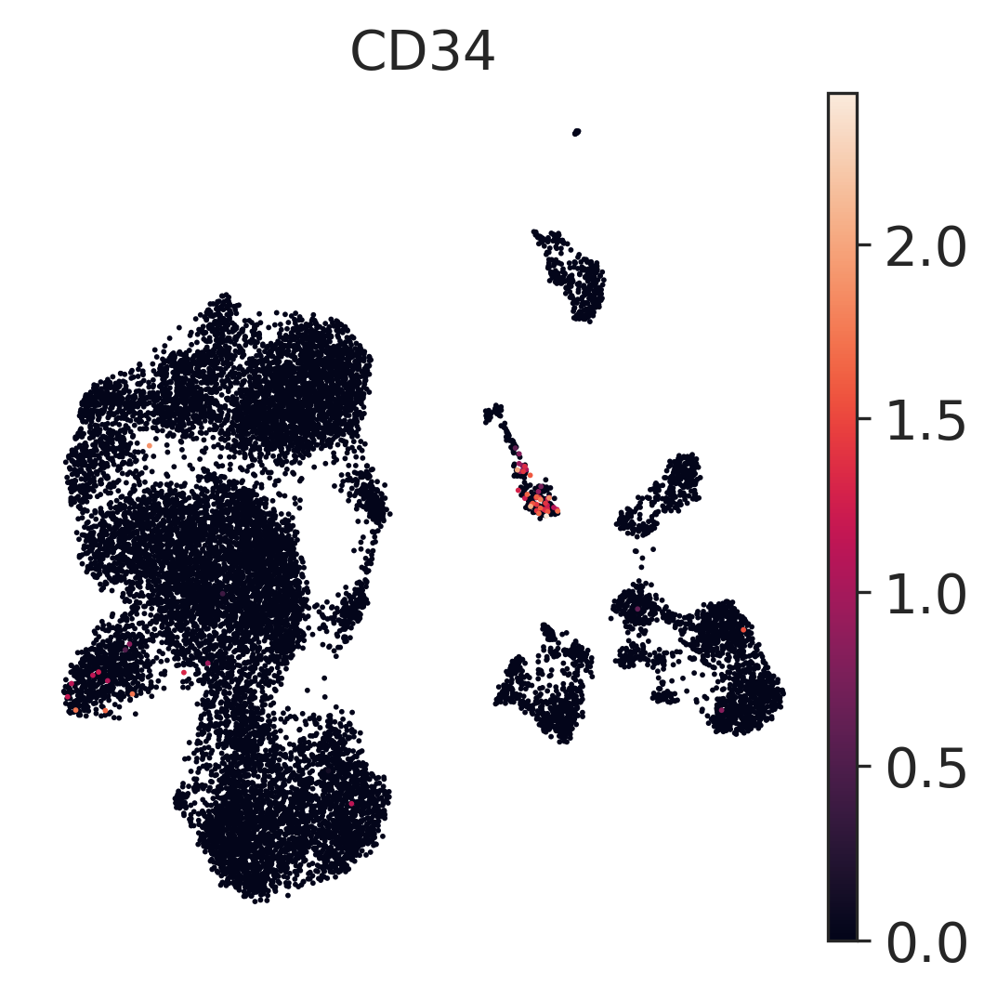

In [50]:
sc.pl.umap(adata, color="CD34", frameon=False)

In [ ]:
!pip install symphonypy

In [55]:
import symphonypy as sp

In [56]:
adata_reference = sp.datasets.pbmcs_10x_reference()

try downloading from url
https://zenodo.org/record/7607565/files/pbmcs_10x_reference.h5ad
... this may take a while but only happens once
creating directory data/symphony_ref/ for saving data


  0%|          | 0.00/38.9M [00:00<?, ?B/s]

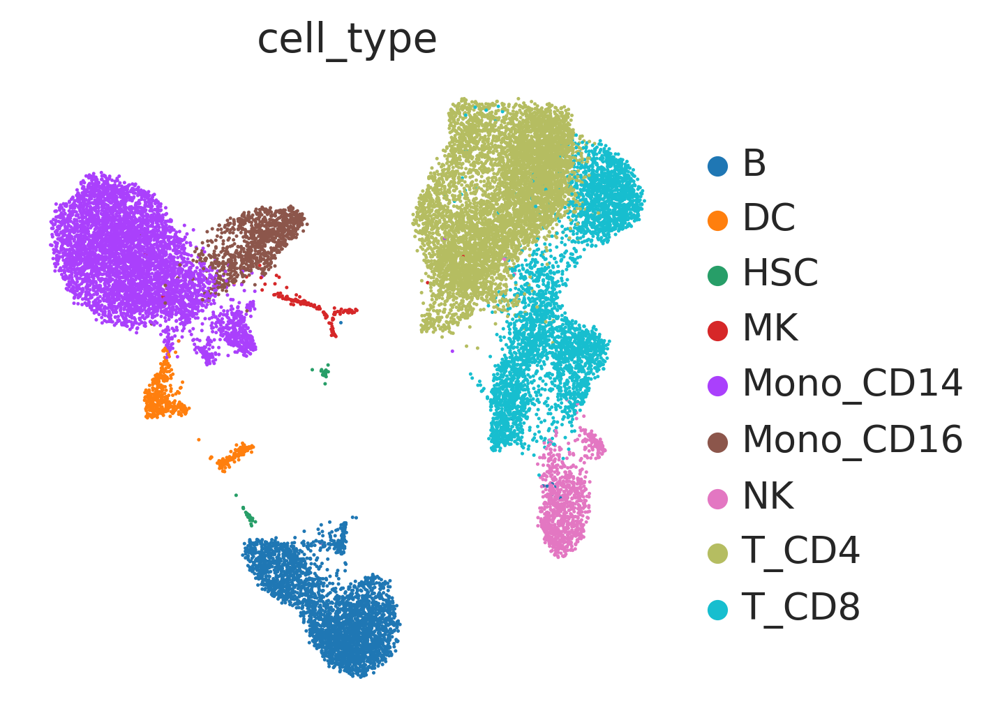

In [57]:
sc.pl.umap(adata_reference, color="cell_type", frameon=False)

In [58]:
if adata.raw is not None:
    adata_query = adata.raw.to_adata()
else:
    adata_query = adata.copy()


if "donor" not in adata_query.obs.columns:
    adata_query.obs["donor"] = "query"

In [59]:
sp.tl.map_embedding(adata_query, adata_reference, key="donor")
sp.tl.per_cell_confidence(adata_query, adata_reference)
sp.tl.transfer_labels_kNN(adata_query, adata_reference, ref_labels=["cell_type"])

/usr/local/lib/python3.12/dist-packages/symphonypy/tl.py:344: UserWarning: Gene expressions in adata_query should be log1p-transformed
  warnings.warn("Gene expressions in adata_query should be log1p-transformed")
/usr/local/lib/python3.12/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


In [60]:
adata_query_umap = adata_query.copy()
sp.tl.ingest(adata_query_umap, adata_reference)

/usr/local/lib/python3.12/dist-packages/symphonypy/tl.py:268: FutureWarning: The specified parameters ('inplace',) are no longer positional. Please specify them like `inplace=True`
  return ing.to_adata(inplace)


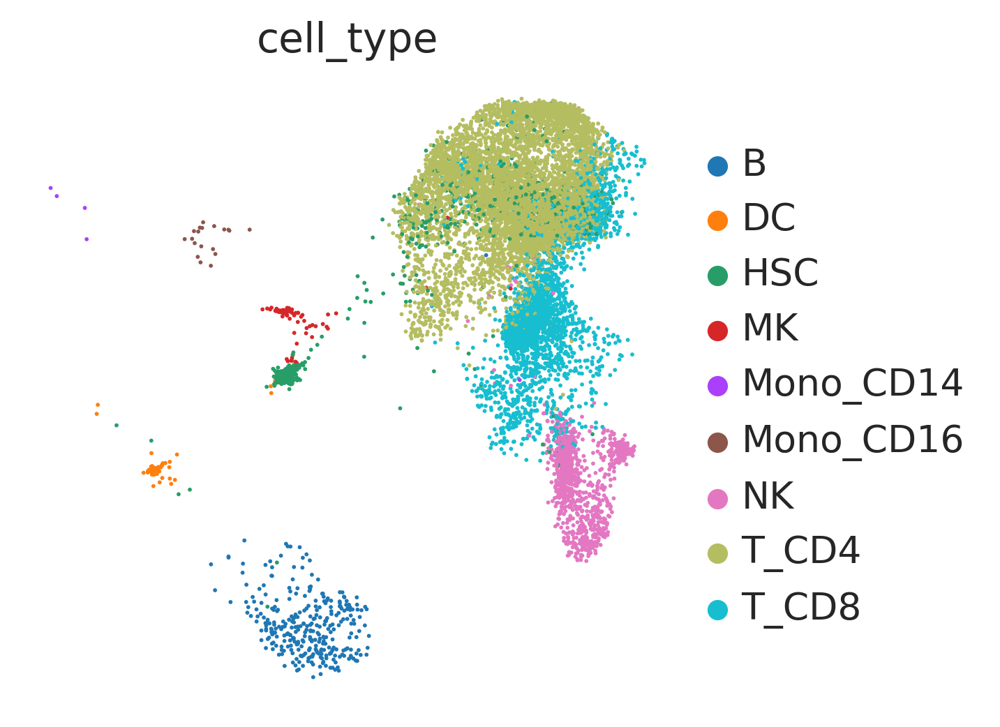

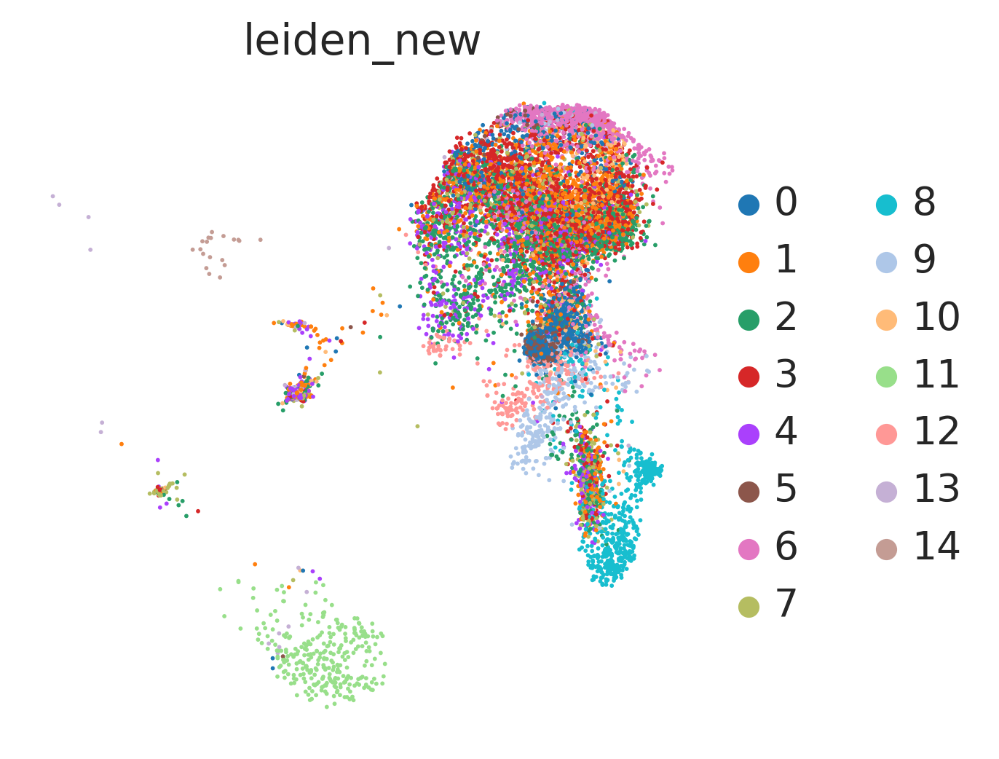

In [62]:
sc.pl.umap(adata_query_umap, color=["cell_type"], frameon=False)
sc.pl.umap(adata_query_umap, color=["leiden_new"], frameon=False, wspace=0.3)

/usr/local/lib/python3.12/dist-packages/symphonypy/tl.py:344: UserWarning: Gene expressions in adata_query should be log1p-transformed
  warnings.warn("Gene expressions in adata_query should be log1p-transformed")
/usr/local/lib/python3.12/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.12/dist-packages/symphonypy/tl.py:268: FutureWarning: The specified parameters ('inplace',) are no longer positional. Please specify them like `inplace=True`
  return ing.to_adata(inplace)


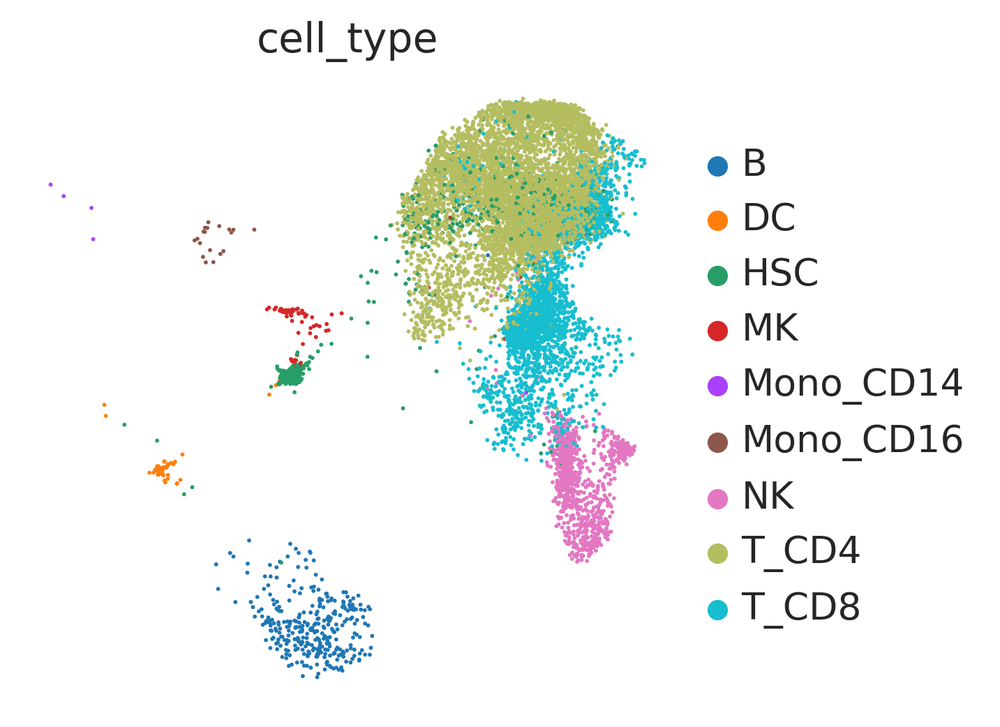

In [63]:
import numpy as np
import scanpy as sc
import symphonypy as sp

adata_query = adata.raw.to_adata() if adata.raw is not None else adata.copy()

Xmax = adata_query.X.max() if not hasattr(adata_query.X, "A") else adata_query.X.A.max()
if Xmax > 30:
    sc.pp.normalize_total(adata_query, target_sum=1e4)
    sc.pp.log1p(adata_query)

ref_genes = adata_reference.var_names
common = adata_query.var_names.intersection(ref_genes)

adata_query = adata_query[:, common].copy()
adata_reference_sub = adata_reference[:, common].copy()

if "donor" not in adata_query.obs.columns:
    adata_query.obs["donor"] = "query"

sp.tl.map_embedding(adata_query, adata_reference_sub, key="donor")
sp.tl.per_cell_confidence(adata_query, adata_reference_sub)
sp.tl.transfer_labels_kNN(adata_query, adata_reference_sub, ref_labels=["cell_type"])

adata_query_umap = adata_query.copy()
sp.tl.ingest(adata_query_umap, adata_reference_sub)

sc.pl.umap(adata_query_umap, color=["cell_type"], frameon=False)

In [64]:
adata_query.obs["cell_type"].value_counts()

,count
cell_type,
T_CD4,6406
T_CD8,4757
HSC,2814
NK,1069
B,318
MK,80
DC,58
Mono_CD16,19
Mono_CD14,6


In [66]:
import numpy as np

X = adata.raw.X if adata.raw is not None else adata.X
xmax = X.max() if not hasattr(X, "A") else X.A.max()
print("Xmax =", xmax)

Xmax = 8.990784


In [67]:
import pandas as pd

ct = pd.crosstab(adata_query_umap.obs["leiden_new"], adata_query_umap.obs["cell_type"])
display(ct)

ct_frac = ct.div(ct.sum(axis=1), axis=0)
display(ct_frac.style.format("{:.2f}"))

purity = ct_frac.max(axis=1).sort_values(ascending=False)
print("Cluster purity (max cell_type fraction):")
display(purity.to_frame("purity"))

major = ct_frac.idxmax(axis=1)
print("Major cell_type per leiden_new:")
display(major.to_frame("major_cell_type"))

cell_type,B,DC,HSC,MK,Mono_CD14,Mono_CD16,NK,T_CD4,T_CD8
leiden_new,,,,,,,,,
0,3,0,40,5,0,0,6,359,1932
1,1,7,939,36,0,0,117,1043,183
2,1,8,422,3,0,0,143,1275,283
3,0,7,135,1,0,0,91,1640,251
4,2,4,855,21,0,0,119,509,50
5,1,0,8,3,0,0,0,84,1038
6,0,0,0,0,0,0,0,853,171
7,1,27,227,2,0,0,89,284,60
8,0,0,0,0,0,0,489,3,93


cell_type,B,DC,HSC,MK,Mono_CD14,Mono_CD16,NK,T_CD4,T_CD8
leiden_new,,,,,,,,,
0,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.15,0.82
1,0.00,0.00,0.40,0.02,0.00,0.00,0.05,0.45,0.08
2,0.00,0.00,0.20,0.00,0.00,0.00,0.07,0.60,0.13
3,0.00,0.00,0.06,0.00,0.00,0.00,0.04,0.77,0.12
4,0.00,0.00,0.55,0.01,0.00,0.00,0.08,0.33,0.03
5,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.07,0.92
6,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.83,0.17
7,0.00,0.04,0.33,0.00,0.00,0.00,0.13,0.41,0.09
8,0.00,0.00,0.00,0.00,0.00,0.00,0.84,0.01,0.16


Cluster purity (max cell_type fraction):


,purity
leiden_new,
14,1.000000
11,0.983660
5,0.915344
9,0.910995
8,0.835897
6,0.833008
0,0.823881
12,0.821782
3,0.771765


Major cell_type per leiden_new:


,major_cell_type
leiden_new,
0,T_CD8
1,T_CD4
2,T_CD4
3,T_CD4
4,HSC
5,T_CD8
6,T_CD4
7,T_CD4
8,NK


use_raw = True
score_T_lineage: found 7 genes -> ['TRAC', 'TRBC1', 'TRBC2', 'CD3D', 'CD3E', 'CD247', 'LTB']
score_T_blast: found 11 genes -> ['DNTT', 'SOX4', 'MEF2C', 'LMO2', 'HHEX', 'BCL11B', 'LEF1', 'TCF7', 'RAG1', 'RAG2', 'PTCRA']
score_prolif: found 14 genes -> ['MKI67', 'TOP2A', 'TYMS', 'UBE2C', 'HMGB2', 'STMN1', 'PCLAF', 'CKS1B', 'MCM2', 'MCM3', 'MCM4', 'MCM5', 'PCNA', 'TK1']
score_cytotox: found 8 genes -> ['NKG7', 'GNLY', 'PRF1', 'GZMB', 'GZMH', 'CTSW', 'KLRD1', 'FCER1G']
computing score 'score_T_lineage'
    finished: added
    'score_T_lineage', score of gene set (adata.obs).
    200 total control genes are used. (0:00:02)
computing score 'score_T_blast'
    finished: added
    'score_T_blast', score of gene set (adata.obs).
    349 total control genes are used. (0:00:01)
computing score 'score_prolif'
    finished: added
    'score_prolif', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'score_cytotox'
    finished: added
    '

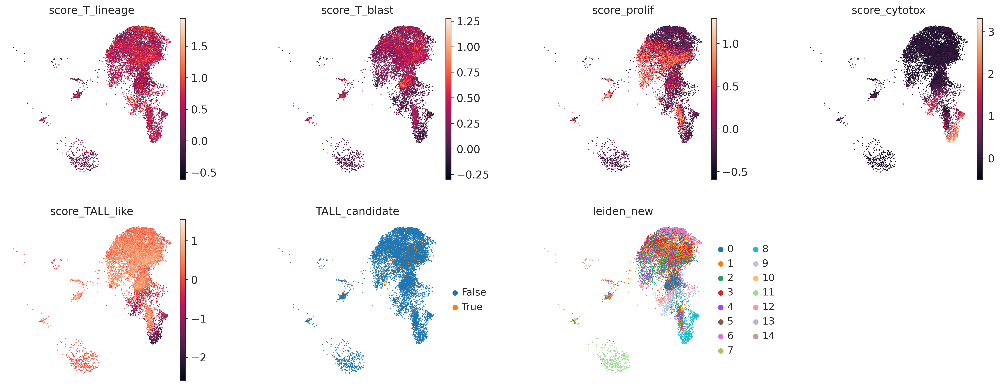

In [71]:
import scanpy as sc
import numpy as np
import pandas as pd

adata_full = adata.copy()

adata_full.obsm["X_umap"] = adata_query_umap.obsm["X_umap"].copy()
adata_full.obs["leiden_new"] = adata_query_umap.obs["leiden_new"].astype("category").copy()

use_raw = adata_full.raw is not None
print("use_raw =", use_raw)

if use_raw:
    base_names = adata_full.raw.var_names
else:
    base_names = adata_full.var_names

upper_to_real = {}
for g in base_names:
    gu = str(g).upper()

    if gu not in upper_to_real:
        upper_to_real[gu] = g

def map_genes_case_insensitive(glist):
    out = []
    for g in glist:
        gg = str(g).upper()
        if gg in upper_to_real:
            out.append(upper_to_real[gg])

    seen = set()
    out2 = []
    for g in out:
        if g not in seen:
            out2.append(g)
            seen.add(g)
    return out2


T_LINEAGE = ["TRAC","TRBC1","TRBC2","CD3D","CD3E","CD247","LTB"]
T_BLAST   = ["DNTT","SOX4","MEF2C","LMO2","HHEX","BCL11B","LEF1","TCF7","RAG1","RAG2","PTCRA"]
PROLIF    = ["MKI67","TOP2A","TYMS","UBE2C","HMGB2","STMN1","PCLAF","CKS1B","MCM2","MCM3","MCM4","MCM5","PCNA","TK1"]
CYTOTOX   = ["NKG7","GNLY","PRF1","GZMB","GZMH","CTSW","KLRD1","FCER1G"]

gene_sets = {
    "score_T_lineage": map_genes_case_insensitive(T_LINEAGE),
    "score_T_blast":   map_genes_case_insensitive(T_BLAST),
    "score_prolif":    map_genes_case_insensitive(PROLIF),
    "score_cytotox":   map_genes_case_insensitive(CYTOTOX),
}

for k, v in gene_sets.items():
    print(f"{k}: found {len(v)} genes -> {v}")


for k, v in gene_sets.items():
    if len(v) >= 2:
        sc.tl.score_genes(adata_full, v, score_name=k, use_raw=use_raw)
    else:
        adata_full.obs[k] = 0.0


adata_full.obs["score_TALL_like"] = (
    adata_full.obs["score_T_blast"] + 0.5 * adata_full.obs["score_prolif"] - 0.7 * adata_full.obs["score_cytotox"]
)

thr = np.quantile(adata_full.obs["score_TALL_like"], 0.95)
adata_full.obs["TALL_candidate"] = (adata_full.obs["score_TALL_like"] >= thr).astype("category")

print("thr =", thr)
print(adata_full.obs["TALL_candidate"].value_counts())


sc.pl.umap(
    adata_full,
    color=[
        "score_T_lineage","score_T_blast","score_prolif","score_cytotox",
        "score_TALL_like","TALL_candidate","leiden_new"
    ],
    frameon=False,
    wspace=0.4
)

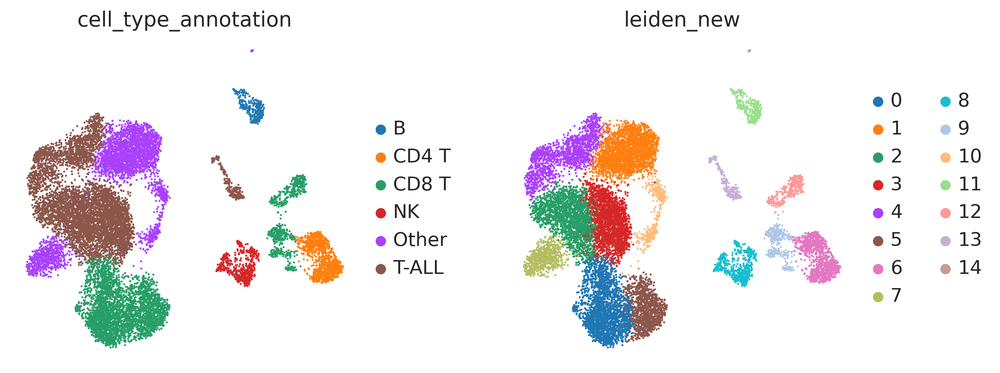

In [87]:
leiden_to_ct = {
    "0": "CD8 T",
    "5": "CD8 T",
    "9": "CD8 T",
    "12": "CD8 T",
    "6": "CD4 T",
    "8": "NK",
    "11": "B",
    "4": "T-ALL",
    "2": "T-ALL",
    "3": "T-ALL",
    "13": "T-ALL",

}

adata.obs["cell_type_annotation"] = (
    adata.obs["leiden_new"].astype(str).map(leiden_to_ct).fillna("Other")
).astype("category")

sc.pl.umap(adata, color=["cell_type_annotation", "leiden_new"], frameon=False, wspace=0.3)

In [84]:
# import liana
import liana as li
# needed for visualization and toy data
import scanpy as sc

In [85]:
li.mt.show_methods()

,Method Name,Magnitude Score,Specificity Score,Reference
0,CellPhoneDB,lr_means,cellphone_pvals,"Efremova, M., Vento-Tormo, M., Teichmann, S.A...."
0,Connectome,expr_prod,scaled_weight,"Raredon, M.S.B., Yang, J., Garritano, J., Wang..."
0,log2FC,None,lr_logfc,"Dimitrov, D., Türei, D., Garrido-Rodriguez, M...."
0,NATMI,expr_prod,spec_weight,"Hou, R., Denisenko, E., Ong, H.T., Ramilowski,..."
0,SingleCellSignalR,lrscore,None,"Cabello-Aguilar, S., Alame, M., Kon-Sun-Tack, ..."
0,Rank_Aggregate,magnitude_rank,specificity_rank,"Dimitrov, D., Türei, D., Garrido-Rodriguez, M...."
0,Geometric Mean,lr_gmeans,gmean_pvals,CellPhoneDBv2's permutation approach applied t...
0,scSeqComm,inter_score,None,"Baruzzo, G., Cesaro, G., Di Camillo, B. 2022. ..."
0,CellChat,lr_probs,cellchat_pvals,"Jin, S., Guerrero-Juarez, C.F., Zhang, L., Cha..."


In [88]:
assert "cell_type_annotation" in adata.obs.columns, "Нет adata.obs['cell_type_annotation']"
print("Groups:", adata.obs["cell_type_annotation"].value_counts())

use_raw = adata.raw is not None
print("use_raw =", use_raw)

Groups: cell_type_annotation
T-ALL    6039
CD8 T    4164
Other    3409
CD4 T    1024
NK        585
B         306
Name: count, dtype: int64
use_raw = True


In [89]:
min_cells = 30
keep = adata.obs["cell_type_annotation"].value_counts()
keep = keep[keep >= min_cells].index.tolist()

adata_liana = adata[adata.obs["cell_type_annotation"].isin(keep)].copy()
adata_liana.obs["cell_type_annotation"] = adata_liana.obs["cell_type_annotation"].astype("category")

print("Kept groups:", adata_liana.obs["cell_type_annotation"].value_counts())

Kept groups: cell_type_annotation
T-ALL    6039
CD8 T    4164
Other    3409
CD4 T    1024
NK        585
B         306
Name: count, dtype: int64


In [90]:
adata_liana.var_names = pd.Index([g.upper() for g in adata_liana.var_names])

from liana.method import cellphonedb, natmi

cellphonedb(
    adata_liana,
    groupby="cell_type_annotation",
    resource_name="cellphonedb",
    expr_prop=0.1,
    n_perms=None,
    use_raw=use_raw,
    key_added="cpdb_res",
    verbose=True
)

natmi(
    adata_liana,
    groupby="cell_type_annotation",
    resource_name="cellphonedb",
    expr_prop=0.1,
    use_raw=use_raw,
    key_added="natmi_res",
    verbose=True
)

print("cpdb_res columns:", adata_liana.uns["cpdb_res"].columns.tolist())
print("natmi_res columns:", adata_liana.uns["natmi_res"].columns.tolist())

display(adata_liana.uns["cpdb_res"].head(10))
display(adata_liana.uns["natmi_res"].head(10))

/usr/local/lib/python3.12/dist-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:149: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


Generating ligand-receptor stats for 15527 samples and 690 features


/usr/local/lib/python3.12/dist-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:149: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


Generating ligand-receptor stats for 15527 samples and 690 features
cpdb_res columns: ['ligand', 'ligand_complex', 'ligand_means', 'ligand_props', 'receptor', 'receptor_complex', 'receptor_means', 'receptor_props', 'source', 'target', 'lr_means']
natmi_res columns: ['ligand', 'ligand_complex', 'ligand_means', 'ligand_means_sums', 'ligand_props', 'receptor', 'receptor_complex', 'receptor_means', 'receptor_means_sums', 'receptor_props', 'source', 'target', 'expr_prod', 'spec_weight']


,ligand,ligand_complex,ligand_means,ligand_props,receptor,receptor_complex,receptor_means,receptor_props,source,target,lr_means
67,MIF,MIF,2.720548,0.954959,CD74,CD74,4.475214,0.993464,T-ALL,B,3.597881
55,MIF,MIF,2.246308,0.904957,CD74,CD74,4.475214,0.993464,Other,B,3.360761
38,MIF,MIF,1.177285,0.606838,CD74,CD74,4.475214,0.993464,NK,B,2.826250
14,MIF,MIF,1.080739,0.626953,CD74,CD74,4.475214,0.993464,CD4 T,B,2.777977
0,MIF,MIF,1.040570,0.588235,CD74,CD74,4.475214,0.993464,B,B,2.757892
34,COPA,COPA,0.836623,0.468780,CD74,CD74,4.475214,0.993464,CD8 T,B,2.655919
64,COPA,COPA,0.660900,0.526254,CD74,CD74,4.475214,0.993464,Other,B,2.568057
50,COPA,COPA,0.576772,0.328205,CD74,CD74,4.475214,0.993464,NK,B,2.525993
78,COPA,COPA,0.487011,0.486008,CD74,CD74,4.475214,0.993464,T-ALL,B,2.481113
9,COPA,COPA,0.440011,0.271242,CD74,CD74,4.475214,0.993464,B,B,2.457613


,ligand,ligand_complex,ligand_means,ligand_means_sums,ligand_props,receptor,receptor_complex,receptor_means,receptor_means_sums,receptor_props,source,target,expr_prod,spec_weight
67,MIF,MIF,2.720548,8.695271,0.954959,CD74,CD74,4.475214,8.238863,0.993464,T-ALL,B,12.175036,0.169949
55,MIF,MIF,2.246308,8.695271,0.904957,CD74,CD74,4.475214,8.238863,0.993464,Other,B,10.052711,0.140324
38,MIF,MIF,1.177285,8.695271,0.606838,CD74,CD74,4.475214,8.238863,0.993464,NK,B,5.268603,0.073544
14,MIF,MIF,1.080739,8.695271,0.626953,CD74,CD74,4.475214,8.238863,0.993464,CD4 T,B,4.836538,0.067513
0,MIF,MIF,1.040570,8.695271,0.588235,CD74,CD74,4.475214,8.238863,0.993464,B,B,4.656774,0.065003
391,MIF,MIF,2.720548,8.695271,0.954959,CD74,CD74,1.567889,8.238863,0.671795,T-ALL,NK,4.265519,0.059542
34,COPA,COPA,0.836623,3.296527,0.468780,CD74,CD74,4.475214,8.238863,0.993464,CD8 T,B,3.744068,0.137854
366,MIF,MIF,2.246308,8.695271,0.904957,CD74,CD74,1.567889,8.238863,0.671795,Other,NK,3.521962,0.049163
64,COPA,COPA,0.660900,3.296527,0.526254,CD74,CD74,4.475214,8.238863,0.993464,Other,B,2.957668,0.108899
50,COPA,COPA,0.576772,3.296527,0.328205,CD74,CD74,4.475214,8.238863,0.993464,NK,B,2.581180,0.095037


In [93]:
from liana.method import cellphonedb

cellphonedb(
    adata_liana,
    groupby="cell_type_annotation",
    resource_name="cellphonedb",
    expr_prop=0.1,
    n_perms=1000,
    seed=1337,
    use_raw=use_raw,
    key_added="cpdb_pval_res",
    verbose=True
)

cp_mag = adata_liana.uns["cpdb_res"].copy()
cp_pv  = adata_liana.uns["cpdb_pval_res"].copy()

nat = adata_liana.uns["natmi_res"].copy()

print("cp_pval_res columns:", cp_pv.columns.tolist())

display(cp_mag.sort_values("lr_means", ascending=False).head(15)[
    ["source","target","ligand","receptor","lr_means"]
])

display(cp_pv.sort_values("cellphone_pvals", ascending=True).head(15)[
    ["source","target","ligand","receptor","lr_means","cellphone_pvals"]
])

key_cols = ["source","target","ligand","receptor"]

merged = (
    cp_mag[key_cols + ["lr_means"]]
    .merge(nat[key_cols + ["expr_prod"]], on=key_cols, how="inner")
)

print("Common LR pairs between cpdb and natmi:", merged.shape[0])
display(merged.sort_values("lr_means", ascending=False).head(10))

corr = merged["lr_means"].corr(merged["expr_prod"], method="spearman")
print("Spearman corr (lr_means vs expr_prod) =", corr)

/usr/local/lib/python3.12/dist-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:149: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


Generating ligand-receptor stats for 15527 samples and 690 features


100%|██████████| 1000/1000 [00:14<00:00, 67.98it/s]


cp_pval_res columns: ['ligand', 'ligand_complex', 'ligand_means', 'ligand_props', 'receptor', 'receptor_complex', 'receptor_means', 'receptor_props', 'source', 'target', 'lr_means', 'cellphone_pvals']


,source,target,ligand,receptor,lr_means
67,T-ALL,B,MIF,CD74,3.597881
55,Other,B,MIF,CD74,3.360761
38,NK,B,MIF,CD74,2.826250
14,CD4 T,B,MIF,CD74,2.777977
0,B,B,MIF,CD74,2.757892
34,CD8 T,B,COPA,CD74,2.655919
64,Other,B,COPA,CD74,2.568057
50,NK,B,COPA,CD74,2.525993
78,T-ALL,B,COPA,CD74,2.481113
9,B,B,COPA,CD74,2.457613


,source,target,ligand,receptor,lr_means,cellphone_pvals
538,T-ALL,Other,GPI,NTRK1,0.522307,0.0
446,CD4 T,Other,TNF,VSIR,0.294523,0.0
101,CD4 T,CD4 T,TNF,FAS,0.324804,0.0
12,CD4 T,B,FLT3LG,FLT3,0.325371,0.0
148,Other,CD4 T,LCK,CD8B,0.328447,0.0
39,NK,B,ITGAL,ICAM3,0.503264,0.0
124,NK,CD4 T,ITGAL,ICAM3,0.565011,0.0
621,Other,T-ALL,LGALS9,SLC1A5,0.570013,0.0
526,T-ALL,Other,SELL,SELPLG,0.570719,0.0
65,Other,B,LGALS9,PTPRK,0.571666,0.0


Common LR pairs between cpdb and natmi: 618


,source,target,ligand,receptor,lr_means,expr_prod
0,T-ALL,B,MIF,CD74,3.597881,12.175036
1,Other,B,MIF,CD74,3.360761,10.052711
2,NK,B,MIF,CD74,2.826250,5.268603
3,CD4 T,B,MIF,CD74,2.777977,4.836538
4,B,B,MIF,CD74,2.757892,4.656774
5,CD8 T,B,COPA,CD74,2.655919,3.744068
6,Other,B,COPA,CD74,2.568057,2.957668
7,NK,B,COPA,CD74,2.525993,2.581180
8,T-ALL,B,COPA,CD74,2.481113,2.179479
9,B,B,COPA,CD74,2.457613,1.969146


Spearman corr (lr_means vs expr_prod) = 0.9752625601191194


In [96]:
cp_pv = adata_liana.uns["cpdb_pval_res"].copy()

print("n rows:", cp_pv.shape[0])
print("pval dtype:", cp_pv["cellphone_pvals"].dtype)

print("unique pvals (first 20):", np.sort(cp_pv["cellphone_pvals"].unique())[:20])

desc = cp_pv["cellphone_pvals"].describe(percentiles=[0, .001, .01, .05, .1, .25, .5, .75, .9, .95, .99, .999, 1])
display(desc.to_frame("cellphone_pvals"))

print("pval==0:", (cp_pv["cellphone_pvals"] == 0).sum())
print("pval==1:", (cp_pv["cellphone_pvals"] == 1).sum())

display(cp_pv.sort_values("cellphone_pvals", ascending=True).head(20)[
    ["source","target","ligand","receptor","lr_means","cellphone_pvals"]
])
display(cp_pv.sort_values("cellphone_pvals", ascending=False).head(20)[
    ["source","target","ligand","receptor","lr_means","cellphone_pvals"]
])

n rows: 594
pval dtype: float64
unique pvals (first 20): [0.    0.001 0.002 0.003 0.004 0.005 0.007 0.012 0.013 0.014 0.018 0.066
 0.069 0.07  0.071 0.084 0.088 0.104 0.114 0.118]


,cellphone_pvals
count,594.000000
mean,0.342843
std,0.460740
min,0.000000
0%,0.000000
0.1%,0.000000
1%,0.000000
5%,0.000000
10%,0.000000
25%,0.000000


pval==0: 348
pval==1: 156


,source,target,ligand,receptor,lr_means,cellphone_pvals
538,T-ALL,Other,GPI,NTRK1,0.522307,0.0
446,CD4 T,Other,TNF,VSIR,0.294523,0.0
101,CD4 T,CD4 T,TNF,FAS,0.324804,0.0
12,CD4 T,B,FLT3LG,FLT3,0.325371,0.0
148,Other,CD4 T,LCK,CD8B,0.328447,0.0
39,NK,B,ITGAL,ICAM3,0.503264,0.0
124,NK,CD4 T,ITGAL,ICAM3,0.565011,0.0
621,Other,T-ALL,LGALS9,SLC1A5,0.570013,0.0
526,T-ALL,Other,SELL,SELPLG,0.570719,0.0
65,Other,B,LGALS9,PTPRK,0.571666,0.0


,source,target,ligand,receptor,lr_means,cellphone_pvals
642,T-ALL,T-ALL,ITGB2,F11R,0.159191,1.0
623,Other,T-ALL,ITGB2,F11R,0.152995,1.0
234,T-ALL,CD8 T,GRN,TNFRSF1A,0.150918,1.0
236,T-ALL,CD8 T,ITGB2,ICAM3,0.150494,1.0
220,Other,CD8 T,GRN,TNFRSF1A,0.149201,1.0
243,T-ALL,CD8 T,ITGB2,F11R,0.146095,1.0
222,Other,CD8 T,ITGB2,ICAM3,0.144299,1.0
572,CD8 T,T-ALL,SEMA7A,PLXNC1,0.142453,1.0
228,Other,CD8 T,ITGB2,F11R,0.139899,1.0
630,T-ALL,T-ALL,SEMA7A,PLXNC1,0.137275,1.0


In [95]:
cp_pv = adata_liana.uns["cpdb_pval_res"].copy()
n_perms = 1000

cp_pv["pval_fixed"] = cp_pv["cellphone_pvals"].replace(0, 1/n_perms)

cp_pv["neglog10_p"] = -np.log10(cp_pv["pval_fixed"])

display(cp_pv.sort_values("neglog10_p", ascending=False).head(20)[
    ["source","target","ligand","receptor","lr_means","cellphone_pvals","pval_fixed","neglog10_p"]
])

,source,target,ligand,receptor,lr_means,cellphone_pvals,pval_fixed,neglog10_p
627,Other,T-ALL,BDNF,F11R,0.171134,0.000,0.001,3.0
18,CD4 T,B,LTA,RIPK1,0.173184,0.001,0.001,3.0
142,Other,CD4 T,GRN,TNFRSF1B,0.174740,0.000,0.001,3.0
155,T-ALL,CD4 T,GRN,TNFRSF1B,0.176457,0.000,0.001,3.0
390,T-ALL,NK,ITGB2,ICAM1,0.176462,0.000,0.001,3.0
178,CD4 T,CD8 T,LTA,TNFRSF1A,0.182588,0.000,0.001,3.0
563,CD4 T,T-ALL,LTA,RIPK1,0.182672,0.000,0.001,3.0
31,CD8 T,B,PTPRC,CD22,1.472392,0.000,0.001,3.0
431,B,Other,FAM3C,HLA-C,1.475524,0.000,0.001,3.0
497,Other,Other,MIF,CD74,1.499757,0.000,0.001,3.0


In [98]:
from liana.method import geometric_mean

geometric_mean(
    adata_liana,
    groupby="cell_type_annotation",
    resource_name="cellphonedb",
    expr_prop=0.1,
    n_perms=1000,
    seed=1337,
    use_raw=use_raw,
    key_added="gmean_res",
    verbose=True
)

/usr/local/lib/python3.12/dist-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/usr/local/lib/python3.12/dist-packages/liana/method/_pipe_utils/_pre.py:149: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


Generating ligand-receptor stats for 15527 samples and 690 features


100%|██████████| 1000/1000 [00:13<00:00, 74.83it/s]


In [99]:
gmean = adata_liana.uns["gmean_res"]
print(gmean.columns)

Index(['ligand', 'ligand_complex', 'ligand_means', 'ligand_props', 'receptor',
       'receptor_complex', 'receptor_means', 'receptor_props', 'source',
       'target', 'lr_gmeans', 'gmean_pvals'],
      dtype='object')


In [100]:
cp = adata_liana.uns["cpdb_pval_res"].copy()
gm = adata_liana.uns["gmean_res"].copy()

key = ["source","target","ligand","receptor"]

cmp = (
    cp[key + ["lr_means","cellphone_pvals"]]
    .merge(gm[key + ["lr_gmeans","gmean_pvals"]], on=key, how="inner")
)

print("Common LR pairs:", cmp.shape[0])

mag_corr = cmp["lr_means"].corr(cmp["lr_gmeans"], method="spearman")
print("Spearman corr (magnitude): lr_means vs lr_gmeans =", mag_corr)

pv_corr = cmp["cellphone_pvals"].corr(cmp["gmean_pvals"], method="spearman")
print("Spearman corr (pvals): cellphone_pvals vs gmean_pvals =", pv_corr)

sig_cp = (cmp["cellphone_pvals"] < 0.05).sum()
sig_gm = (cmp["gmean_pvals"] < 0.05).sum()
sig_both = ((cmp["cellphone_pvals"] < 0.05) & (cmp["gmean_pvals"] < 0.05)).sum()

print("Significant CPDB p<0.05:", sig_cp)
print("Significant GMean p<0.05:", sig_gm)
print("Significant in BOTH:", sig_both)

display(
    cmp.sort_values("lr_means", ascending=False).head(15)
    [["source","target","ligand","receptor","lr_means","lr_gmeans","cellphone_pvals","gmean_pvals"]]
)

display(
    cmp.sort_values("cellphone_pvals", ascending=True).head(15)
    [["source","target","ligand","receptor","lr_means","lr_gmeans","cellphone_pvals","gmean_pvals"]]
)

Common LR pairs: 618
Spearman corr (magnitude): lr_means vs lr_gmeans = 0.9752625601191194
Spearman corr (pvals): cellphone_pvals vs gmean_pvals = 0.8609255256818097
Significant CPDB p<0.05: 385
Significant GMean p<0.05: 399
Significant in BOTH: 369


,source,target,ligand,receptor,lr_means,lr_gmeans,cellphone_pvals,gmean_pvals
0,T-ALL,B,MIF,CD74,3.597881,3.489275,0.0,0.0
1,Other,B,MIF,CD74,3.360761,3.170601,0.0,0.0
2,NK,B,MIF,CD74,2.826250,2.295344,0.0,0.0
3,CD4 T,B,MIF,CD74,2.777977,2.199213,0.0,0.0
4,B,B,MIF,CD74,2.757892,2.157956,0.0,0.0
5,CD8 T,B,COPA,CD74,2.655919,1.934960,0.0,0.0
6,Other,B,COPA,CD74,2.568057,1.719787,0.0,0.0
7,NK,B,COPA,CD74,2.525993,1.606605,0.0,0.0
8,T-ALL,B,COPA,CD74,2.481113,1.476306,0.0,0.0
9,B,B,COPA,CD74,2.457613,1.403262,0.0,0.0


,source,target,ligand,receptor,lr_means,lr_gmeans,cellphone_pvals,gmean_pvals
300,B,NK,FAM3C,CLEC2D,0.505638,0.414430,0.0,0.0
516,CD4 T,NK,AREG,ICAM1,0.238798,0.238756,0.0,0.0
515,NK,T-ALL,LTA,TNFRSF14,0.239680,0.235289,0.0,0.0
514,CD4 T,Other,TNF,FAS,0.242924,0.208133,0.0,0.0
284,B,B,FAM3C,LAMP1,0.525927,0.451691,0.0,0.0
282,B,CD8 T,FAM3C,LAMP1,0.527488,0.454432,0.0,0.0
281,CD4 T,NK,CD48,CD244,0.528931,0.397919,0.0,0.0
279,CD8 T,Other,COPA,NTRK1,0.531784,0.435737,0.0,0.0
278,CD4 T,Other,CD48,CD244,0.533347,0.407540,0.0,0.0
275,NK,Other,CD52,SIGLEC10,0.543754,0.444956,0.0,0.0


<Axes: >

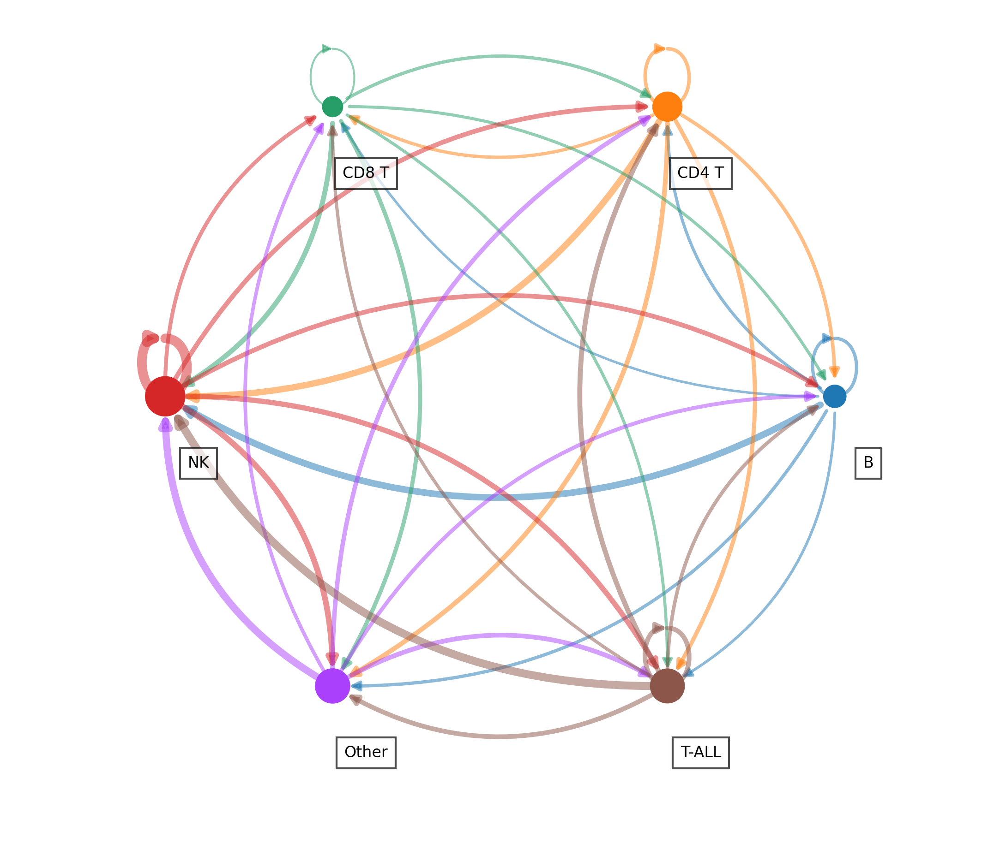

In [110]:
li.pl.circle_plot(
    adata=adata_liana,
    groupby="cell_type_annotation",
    uns_key="cpdb_pval_res",
    score_key="lr_means",
    inverse_score=False,
    filter_fun=lambda x: x["cellphone_pvals"] < 0.05,
    pivot_mode="counts",
    source_labels=["T-ALL", "CD8 T", "CD4 T", "NK", "B"],
    target_labels=["T-ALL", "CD8 T", "CD4 T", "NK", "B"],
    figure_size=(9, 9)
)

<Axes: >

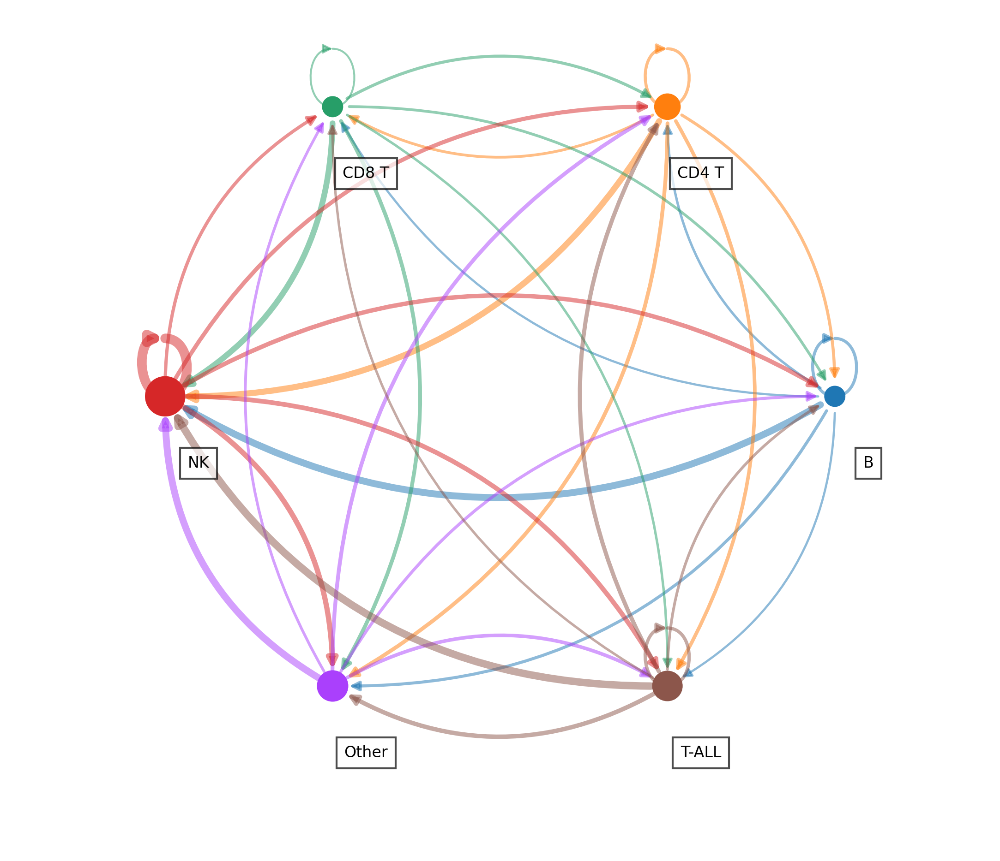

In [111]:
li.pl.circle_plot(
    adata=adata_liana,
    groupby="cell_type_annotation",
    uns_key="gmean_res",
    score_key="lr_gmeans",
    inverse_score=False,
    filter_fun=lambda x: x["gmean_pvals"] < 0.05,
    pivot_mode="counts",
    source_labels=["T-ALL", "CD8 T", "CD4 T", "NK", "B"],
    target_labels=["T-ALL", "CD8 T", "CD4 T", "NK", "B"],
    figure_size=(9, 9)
)

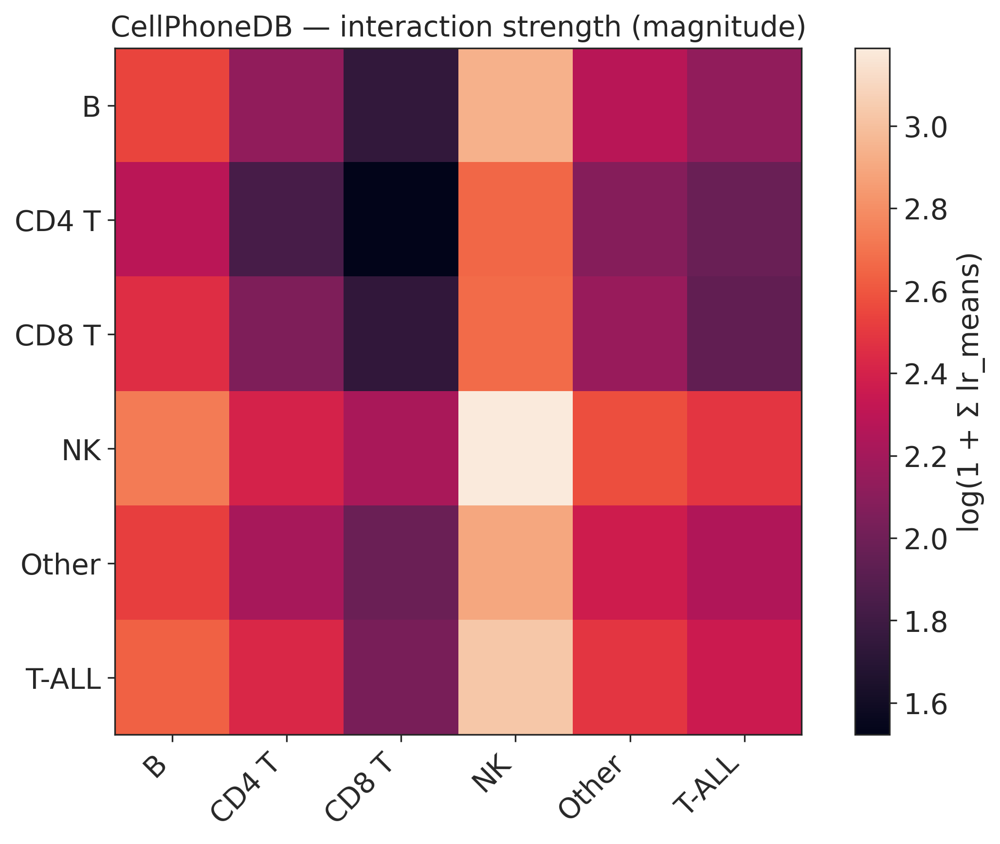

target,B,CD4 T,CD8 T,NK,Other,T-ALL
source,,,,,,
B,11.684999,7.401689,4.757448,17.902567,8.769981,7.402069
CD4 T,8.833678,5.289209,3.585578,13.296300,7.066914,6.202078
CD8 T,10.634147,6.839223,4.711149,13.464915,7.636204,5.985931
NK,14.332889,10.090248,8.252383,23.241135,12.104795,11.035054
Other,11.412129,8.189776,6.258325,17.198425,9.749778,8.464413
T-ALL,12.956413,10.340988,6.631795,19.731886,11.012186,9.589382


In [112]:
cp = cp_mag.copy()

edge_cp = (
    cp
    .groupby(["source", "target"])["lr_means"]
    .sum()
    .reset_index(name="sum_lr_means")
)

mat_cp = (
    edge_cp
    .pivot(index="source", columns="target", values="sum_lr_means")
    .fillna(0)
)

plt.figure(figsize=(8, 6))
plt.imshow(np.log1p(mat_cp.values))
plt.xticks(range(mat_cp.shape[1]), mat_cp.columns, rotation=45, ha="right")
plt.yticks(range(mat_cp.shape[0]), mat_cp.index)
plt.colorbar(label="log(1 + Σ lr_means)")
plt.title("CellPhoneDB — interaction strength (magnitude)")
plt.tight_layout()
plt.show()

mat_cp

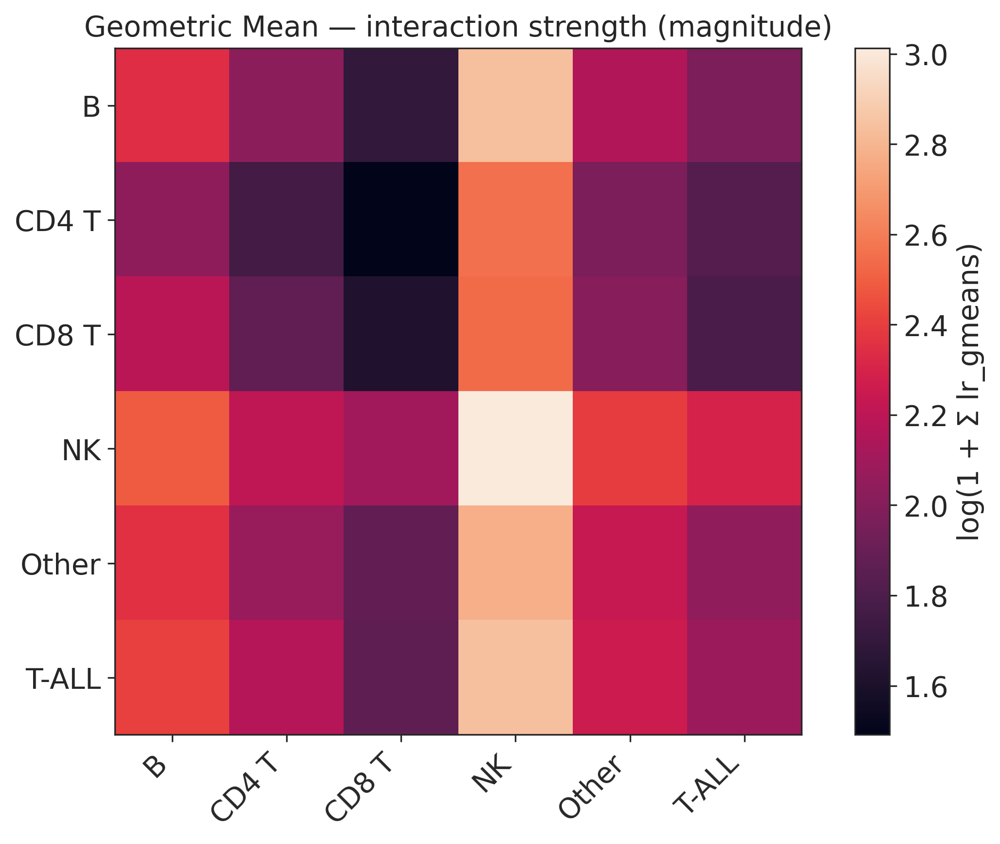

target,B,CD4 T,CD8 T,NK,Other,T-ALL
source,,,,,,
B,9.401390,6.590565,4.439887,16.051117,7.680765,6.183476
CD4 T,6.651155,4.826358,3.443294,11.940877,6.183250,5.209787
CD8 T,7.918798,5.517414,4.064663,11.667135,6.469202,5.013051
NK,11.124796,8.094939,7.165676,19.337978,10.016190,8.924505
Other,9.533760,6.922188,5.559386,15.088170,8.372644,6.764522
T-ALL,10.139818,7.794759,5.485134,16.128914,8.579461,7.012704


In [113]:
gm = gmean.copy()

edge_gm = (
    gm
    .groupby(["source", "target"])["lr_gmeans"]
    .sum()
    .reset_index(name="sum_lr_gmeans")
)

mat_gm = (
    edge_gm
    .pivot(index="source", columns="target", values="sum_lr_gmeans")
    .fillna(0)
)

plt.figure(figsize=(8, 6))
plt.imshow(np.log1p(mat_gm.values))
plt.xticks(range(mat_gm.shape[1]), mat_gm.columns, rotation=45, ha="right")
plt.yticks(range(mat_gm.shape[0]), mat_gm.index)
plt.colorbar(label="log(1 + Σ lr_gmeans)")
plt.title("Geometric Mean — interaction strength (magnitude)")
plt.tight_layout()
plt.show()

mat_gm

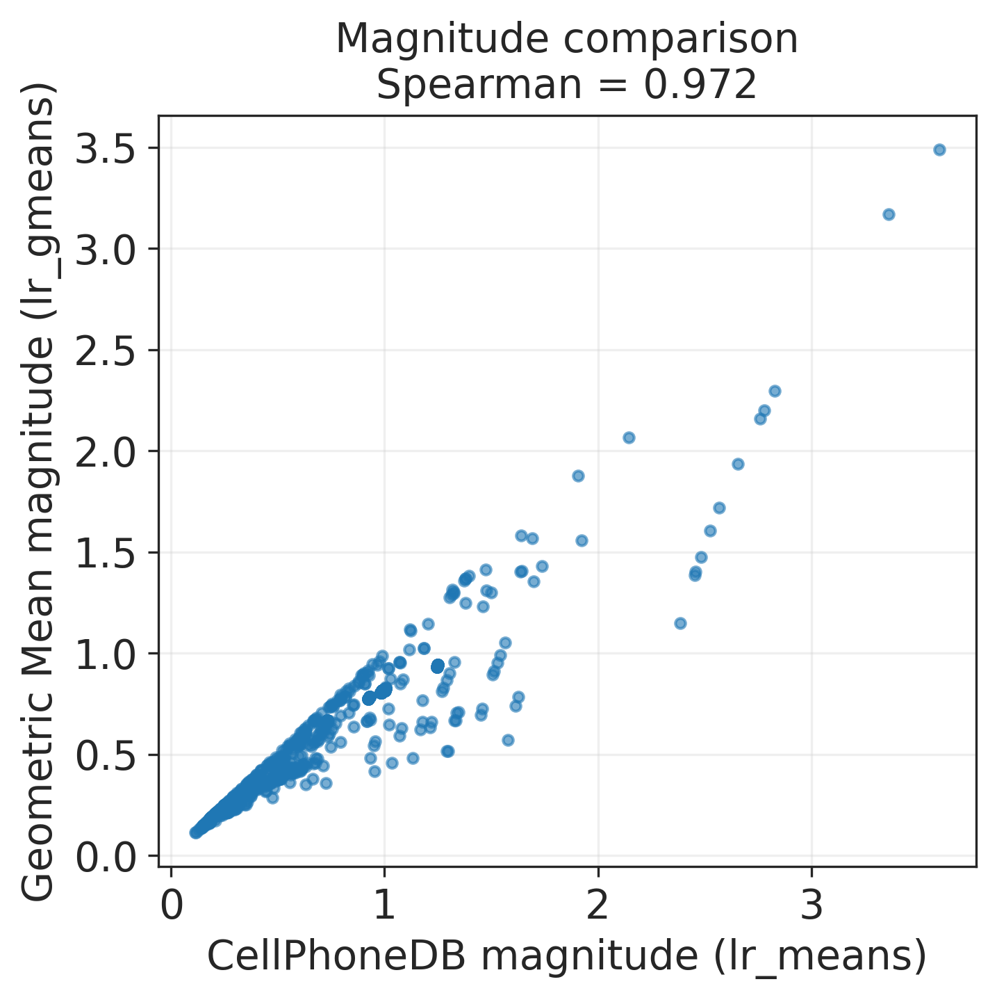

In [114]:
plt.figure(figsize=(5,5))
plt.scatter(
    merged_gm["lr_means"],
    merged_gm["lr_gmeans"],
    s=12,
    alpha=0.6
)

rho = merged_gm["lr_means"].corr(
    merged_gm["lr_gmeans"], method="spearman"
)

plt.xlabel("CellPhoneDB magnitude (lr_means)")
plt.ylabel("Geometric Mean magnitude (lr_gmeans)")
plt.title(f"Magnitude comparison\nSpearman = {rho:.3f}")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

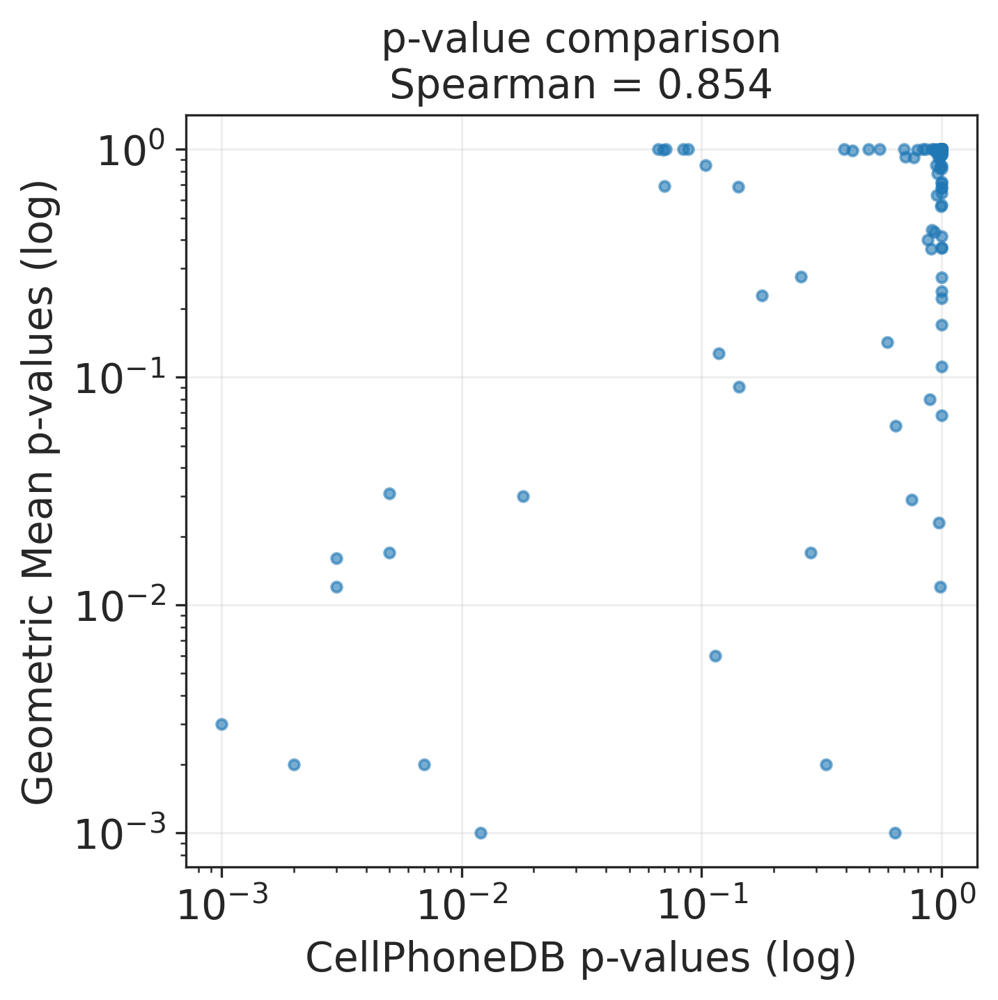

In [115]:
plt.figure(figsize=(5,5))
plt.scatter(
    merged_gm["cellphone_pvals"],
    merged_gm["gmean_pvals"],
    s=12,
    alpha=0.6
)

plt.xscale("log")
plt.yscale("log")

rho_p = merged_gm["cellphone_pvals"].corr(
    merged_gm["gmean_pvals"], method="spearman"
)

plt.xlabel("CellPhoneDB p-values (log)")
plt.ylabel("Geometric Mean p-values (log)")
plt.title(f"p-value comparison\nSpearman = {rho_p:.3f}")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [116]:
np.random.seed(42)

n_A = 300
n_B = 100

A = np.random.normal(loc=0.0, scale=1.0, size=n_A)
B = np.random.normal(loc=0.3, scale=1.0, size=n_B)

In [117]:
def permutation_test(x, y, n_perm=10000):
    obs = np.mean(x) - np.mean(y)
    pooled = np.concatenate([x, y])
    n_x = len(x)

    perms = []
    for _ in range(n_perm):
        np.random.shuffle(pooled)
        perms.append(np.mean(pooled[:n_x]) - np.mean(pooled[n_x:]))

    perms = np.array(perms)
    pval = np.mean(np.abs(perms) >= np.abs(obs))
    return obs, pval

In [118]:
obs_full, p_full = permutation_test(A, B)
print(p_full)

0.0


In [119]:
pvals_sub = []

for i in range(100):
    idx_A = np.random.choice(len(A), size=len(B), replace=False)
    A_sub = A[idx_A]

    _, p = permutation_test(A_sub, B)
    pvals_sub.append(p)

np.mean(pvals_sub), np.std(pvals_sub)

(np.float64(0.008787), np.float64(0.01778304054429388))